In [1]:




# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/incident-impact-prediction/test.csv
/kaggle/input/incident-impact-prediction/train.csv
/kaggle/input/incident-impact-prediction/Sample Submission.csv


In [2]:
#!pip install pandas-profiling

In [3]:
#loading the training and the test data
train = pd.read_csv("../input/incident-impact-prediction/train.csv")
test = pd.read_csv("../input/incident-impact-prediction/test.csv")

In [4]:
#listing out the train data columns
train.columns

Index(['Unnamed: 0', 'ID', 'ID_status', 'active', 'count_reassign',
       'count_opening', 'count_updated', 'ID_caller', 'opened_by',
       'opened_time', 'Created_by', 'created_at', 'updated_by', 'updated_at',
       'type_contact', 'location', 'category_ID', 'user_symptom',
       'Support_group', 'support_incharge', 'Doc_knowledge',
       'confirmation_check', 'impact', 'notify', 'problem_ID',
       'change_request'],
      dtype='object')

In [5]:
#listing out the test data columns
test.columns

Index(['S.No', 'ID', 'ID_status', 'active', 'count_reassign', 'count_opening',
       'count_updated', 'ID_caller', 'opened_by', 'opened_time', 'Created_by',
       'created_at', 'updated_by', 'updated_at', 'type_contact', 'location',
       'category_ID', 'user_symptom', 'Support_group', 'support_incharge',
       'Doc_knowledge', 'confirmation_check', 'notify', 'problem_ID',
       'change_request'],
      dtype='object')

In [6]:
#dropping the s.no column from the test data
test.drop(["S.No"], axis=1, inplace=True)

In [7]:
#dropping the Unnamed: 0 column from the train data
train.drop(["Unnamed: 0"], axis=1,inplace=True)

In [8]:
#replacing the ? in columns in the train data with NaN
train1=train.replace('?', np.NaN)

In [9]:
#replacing the ? in columns in the test data with NaN
test1=test.replace('?', np.NaN)

In [10]:
#checking the information of the train data
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 25 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
active                99198 non-null bool
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
ID_caller             99176 non-null object
opened_by             95870 non-null object
opened_time           99198 non-null object
Created_by            62024 non-null object
created_at            62024 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
type_contact          99198 non-null object
location              99144 non-null object
category_ID           99142 non-null object
user_symptom          76059 non-null object
Support_group         89204 non-null object
support_incharge      79896 non-null object
Doc_knowledge         99198 non-null bool
confirmation_check

In [11]:
train1.columns

Index(['ID', 'ID_status', 'active', 'count_reassign', 'count_opening',
       'count_updated', 'ID_caller', 'opened_by', 'opened_time', 'Created_by',
       'created_at', 'updated_by', 'updated_at', 'type_contact', 'location',
       'category_ID', 'user_symptom', 'Support_group', 'support_incharge',
       'Doc_knowledge', 'confirmation_check', 'impact', 'notify', 'problem_ID',
       'change_request'],
      dtype='object')

In [12]:
#dropping the change_request and problem ID column because of huge number of null values
train1.drop(["change_request","problem_ID" ],axis=1,inplace=True)

In [13]:
train1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,ID_caller,opened_by,opened_time,Created_by,...,type_contact,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,impact,notify
0,INC0000045,New,True,0,0,0,Caller 2403,Opened by 8,29-02-2016 01:16,Created by 6,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
1,INC0000045,Resolved,True,0,0,3,Caller 2403,Opened by 8,29-02-2016 01:16,Created by 6,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
2,INC0000045,Closed,False,0,0,4,Caller 2403,Opened by 8,29-02-2016 01:16,Created by 6,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
3,INC0000047,Active,True,1,0,1,Caller 2403,Opened by 397,29-02-2016 04:40,Created by 171,...,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,2 - Medium,Do Not Notify
4,INC0000047,Active,True,1,0,2,Caller 2403,Opened by 397,29-02-2016 04:40,Created by 171,...,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,2 - Medium,Do Not Notify


In [14]:
#checking the information of the test data
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42514 entries, 0 to 42513
Data columns (total 24 columns):
ID                    42514 non-null object
ID_status             42514 non-null object
active                42514 non-null bool
count_reassign        42514 non-null int64
count_opening         42514 non-null int64
count_updated         42514 non-null int64
ID_caller             42507 non-null object
opened_by             41007 non-null object
opened_time           42514 non-null object
Created_by            26612 non-null object
created_at            26612 non-null object
updated_by            42514 non-null object
updated_at            42514 non-null object
type_contact          42514 non-null object
location              42492 non-null object
category_ID           42492 non-null object
user_symptom          32689 non-null object
Support_group         38295 non-null object
support_incharge      34320 non-null object
Doc_knowledge         42514 non-null bool
confirmation_check

In [15]:
#dropping the change_request and Problem_ID column because of huge number of null values
test1.drop(["change_request","problem_ID"],axis=1,inplace=True)

In [16]:
test1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,ID_caller,opened_by,opened_time,Created_by,...,updated_at,type_contact,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify
0,INC0000045,Resolved,True,0,0,2,Caller 2403,Opened by 8,29-02-2016 01:16,Created by 6,...,29-02-2016 08:53,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,Do Not Notify
1,INC0000047,New,True,0,0,0,Caller 2403,Opened by 397,29-02-2016 04:40,Created by 171,...,29-02-2016 04:57,Phone,Location 165,Category 40,Symptom 471,Group 70,Resolver 89,True,False,Do Not Notify
2,INC0000047,Active,True,1,0,3,Caller 2403,Opened by 397,29-02-2016 04:40,Created by 171,...,29-02-2016 11:31,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,Do Not Notify
3,INC0000047,Resolved,True,1,0,7,Caller 2403,Opened by 397,29-02-2016 04:40,Created by 171,...,01-03-2016 09:52,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 89,True,False,Do Not Notify
4,INC0000057,New,True,0,0,4,Caller 4416,Opened by 8,29-02-2016 06:10,NaN,...,01-03-2016 02:54,Phone,Location 204,Category 20,Symptom 471,Group 70,NaN,True,False,Do Not Notify


# Exploratory Data Analysis

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pdp

In [18]:
#Creating the Exploratory Data Analysis of our dataset
report = pdp.ProfileReport(train1, title='Pandas Profiling Report', style={'full_width':True})

report

In [19]:
#dropping the created_at and created_by columns because they have almost 40% missing values
train1.drop(["created_at","Created_by"], axis=1, inplace=True)

In [20]:
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
active                99198 non-null bool
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
ID_caller             99176 non-null object
opened_by             95870 non-null object
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
type_contact          99198 non-null object
location              99144 non-null object
category_ID           99142 non-null object
user_symptom          76059 non-null object
Support_group         89204 non-null object
support_incharge      79896 non-null object
Doc_knowledge         99198 non-null bool
confirmation_check    99198 non-null bool
impact                99198 non-null object
notify              

In [21]:
train1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,ID_caller,opened_by,opened_time,updated_by,...,type_contact,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,impact,notify
0,INC0000045,New,True,0,0,0,Caller 2403,Opened by 8,29-02-2016 01:16,Updated by 21,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
1,INC0000045,Resolved,True,0,0,3,Caller 2403,Opened by 8,29-02-2016 01:16,Updated by 804,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
2,INC0000045,Closed,False,0,0,4,Caller 2403,Opened by 8,29-02-2016 01:16,Updated by 908,...,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,2 - Medium,Do Not Notify
3,INC0000047,Active,True,1,0,1,Caller 2403,Opened by 397,29-02-2016 04:40,Updated by 21,...,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,2 - Medium,Do Not Notify
4,INC0000047,Active,True,1,0,2,Caller 2403,Opened by 397,29-02-2016 04:40,Updated by 21,...,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,2 - Medium,Do Not Notify


In [22]:
#Creating the Exploratory Data Analysis of our test dataset
report1 = pdp.ProfileReport(test1, title='Pandas Profiling Report', style={'full_width':True})

report1

In [23]:
#dropping the created_at and created_by columns from the test datast because they have almost 40% missing values
test1.drop(["created_at","Created_by"], axis=1, inplace=True)

In [24]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42514 entries, 0 to 42513
Data columns (total 20 columns):
ID                    42514 non-null object
ID_status             42514 non-null object
active                42514 non-null bool
count_reassign        42514 non-null int64
count_opening         42514 non-null int64
count_updated         42514 non-null int64
ID_caller             42507 non-null object
opened_by             41007 non-null object
opened_time           42514 non-null object
updated_by            42514 non-null object
updated_at            42514 non-null object
type_contact          42514 non-null object
location              42492 non-null object
category_ID           42492 non-null object
user_symptom          32689 non-null object
Support_group         38295 non-null object
support_incharge      34320 non-null object
Doc_knowledge         42514 non-null bool
confirmation_check    42514 non-null bool
notify                42514 non-null object
dtypes: bool(3), int

In [25]:
test1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,ID_caller,opened_by,opened_time,updated_by,updated_at,type_contact,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify
0,INC0000045,Resolved,True,0,0,2,Caller 2403,Opened by 8,29-02-2016 01:16,Updated by 642,29-02-2016 08:53,Phone,Location 143,Category 55,Symptom 72,Group 56,NaN,True,False,Do Not Notify
1,INC0000047,New,True,0,0,0,Caller 2403,Opened by 397,29-02-2016 04:40,Updated by 746,29-02-2016 04:57,Phone,Location 165,Category 40,Symptom 471,Group 70,Resolver 89,True,False,Do Not Notify
2,INC0000047,Active,True,1,0,3,Caller 2403,Opened by 397,29-02-2016 04:40,Updated by 804,29-02-2016 11:31,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 31,True,False,Do Not Notify
3,INC0000047,Resolved,True,1,0,7,Caller 2403,Opened by 397,29-02-2016 04:40,Updated by 332,01-03-2016 09:52,Phone,Location 165,Category 40,Symptom 471,Group 24,Resolver 89,True,False,Do Not Notify
4,INC0000057,New,True,0,0,4,Caller 4416,Opened by 8,29-02-2016 06:10,Updated by 21,01-03-2016 02:54,Phone,Location 204,Category 20,Symptom 471,Group 70,NaN,True,False,Do Not Notify


In [26]:
#exploring the ID column 
train1.ID.value_counts() #24569 values with INC0019396 and INC0044260 repeating the maximum

INC0019396    41
INC0044260    41
INC0020718    34
INC0012815    33
INC0007349    32
              ..
INC0008069     1
INC0023854     1
INC0019499     1
INC0001378     1
INC0008951     1
Name: ID, Length: 24569, dtype: int64

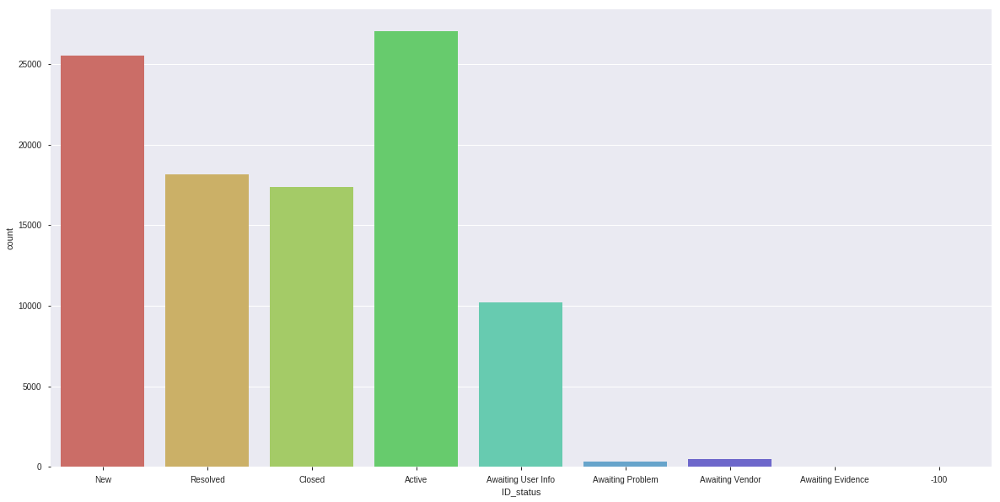

In [27]:
#exploring the ID_status column

plt.figure(figsize=(20,10))
sns.countplot(x='ID_status', data=train1, palette='hls')


In [28]:
train1.ID_status.value_counts() #Active complaints and new are more prominent

Active                27075
New                   25515
Resolved              18158
Closed                17387
Awaiting User Info    10235
Awaiting Vendor         493
Awaiting Problem        307
Awaiting Evidence        26
-100                      2
Name: ID_status, dtype: int64

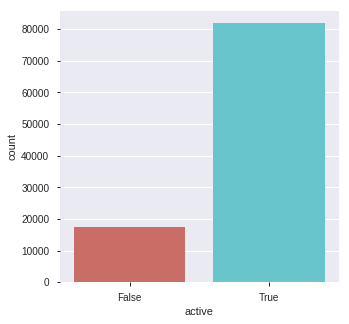

In [29]:
#exploring the active column
plt.figure(figsize=(5,5))
sns.countplot(x='active', data=train1, palette='hls')


In [30]:
train1.active.value_counts() #17388 complaints have been resolved and 81810 are still active

True     81810
False    17388
Name: active, dtype: int64

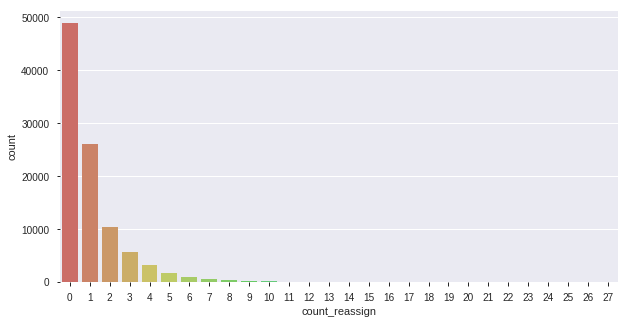

In [31]:
#exploring the count_reassign column
plt.figure(figsize=(10,5))
sns.countplot(x='count_reassign', data=train1, palette='hls')

In [32]:
train1.count_reassign.value_counts() #Number of times the incident has the group or the support analysts changed

0     48853
1     26027
2     10503
3      5777
4      3244
5      1830
6      1017
7       692
8       406
9       262
10      214
11      130
12       85
13       44
14       36
15       13
20       13
17       11
18       11
16        9
19        7
22        6
26        2
23        2
21        1
24        1
25        1
27        1
Name: count_reassign, dtype: int64

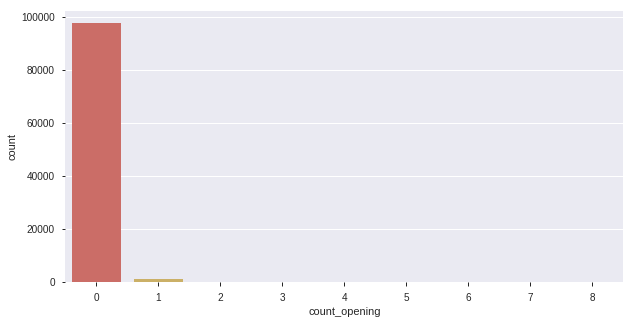

In [33]:
#exploring the count_opening column
plt.figure(figsize=(10,5))
sns.countplot(x='count_opening', data=train1, palette='hls')

In [34]:
train1.count_opening.value_counts() #97571 times,the solution was acepted by the customer  

0    97571
1     1340
2      134
3       77
4       41
6       14
5       13
7        5
8        3
Name: count_opening, dtype: int64

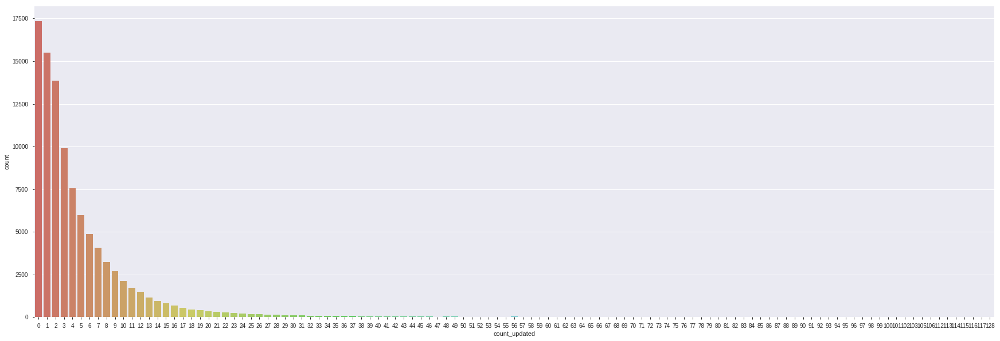

In [35]:
#exploring the count_updated column
plt.figure(figsize=(30,10))
sns.countplot(x='count_updated', data=train1, palette='hls')

In [36]:
train1.count_updated.value_counts() #Number of incident updates until that moment. there are 113 levels of incident updates 

0      17361
1      15502
2      13851
3       9919
4       7546
       ...  
114        1
84         1
128        1
117        1
97         1
Name: count_updated, Length: 113, dtype: int64

In [37]:
#exploring the ID_caller column
train1.ID_caller.value_counts() #caller 1904 has raised the most complaints. there were 5222 different callers

Caller 1904    1001
Caller 290      552
Caller 4514     496
Caller 1441     218
Caller 298      203
               ... 
Caller 4510       1
Caller 5047       1
Caller 5465       1
Caller 1967       1
Caller 2614       1
Name: ID_caller, Length: 5222, dtype: int64

In [38]:
#exploring the opened_by column
train1.opened_by.value_counts() #user 17 reported the most incidents. there were 207 different users

Opened by  17     29027
Opened by  24      5658
Opened by  131     5113
Opened by  108     4234
Opened by  55      3917
                  ...  
Opened by  7          2
Opened by  52         2
Opened by  211        1
Opened by  160        1
Opened by  528        1
Name: opened_by, Length: 207, dtype: int64

In [39]:
#exploring the opened time column
train1.opened_time.value_counts() #most reports were opened on 07-03-2016 at 11:04

07-03-2016 11:04    43
04-07-2016 14:38    41
14-04-2016 20:42    41
07-03-2016 09:25    39
07-03-2016 09:11    38
                    ..
25-04-2016 10:49     1
02-05-2016 11:41     1
25-04-2016 14:32     1
27-04-2016 18:21     1
25-05-2016 19:37     1
Name: opened_time, Length: 19620, dtype: int64

In [40]:
#exploring the updated_by column
train1.updated_by.value_counts() #user 908 updated the most incidents and generated the current log record. There are 751 levels

Updated by 908    25190
Updated by 44      8845
Updated by 60      4951
Updated by 429     2918
Updated by 859     1760
                  ...  
Updated by 847        1
Updated by 854        1
Updated by 959        1
Updated by 545        1
Updated by 433        1
Name: updated_by, Length: 751, dtype: int64

In [41]:
#exploring the updated_at column
train1.updated_at.value_counts() #most incidents were updated on 24-03-2016 at 18:40. There are 43003 levels

24-03-2016 18:40    297
24-03-2016 18:51    282
24-03-2016 18:41    279
24-03-2016 19:00    278
24-03-2016 19:01    272
                   ... 
19-04-2016 12:35      1
01-06-2016 09:10      1
09-03-2016 11:58      1
15-09-2016 15:51      1
07-05-2016 00:38      1
Name: updated_at, Length: 43003, dtype: int64

In [42]:
#exploring the type_contact column
train1.type_contact.value_counts() #most incidents were reported through phone. There are 5 levels

Phone             98306
Self service        714
Email               153
Direct opening       14
IVR                  11
Name: type_contact, dtype: int64

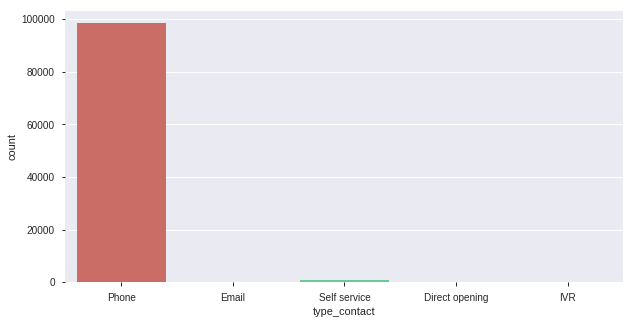

In [43]:
plt.figure(figsize=(10,5))
sns.countplot(x='type_contact', data=train1, palette='hls')

In [44]:
#exploring the location column
train1.location.value_counts() #most incidents were reported at location 204. There are 224 levels

Location 204    22295
Location 161    15867
Location 143    13463
Location 108     8870
Location 93      7980
                ...  
Location 207        2
Location 166        1
Location 203        1
Location 181        1
Location 132        1
Name: location, Length: 224, dtype: int64

In [45]:
#exploring the category_ID column
train1.category_ID.value_counts() #most incidents belonged to category 26. There are 56 levels

Category 26    12937
Category 53    11282
Category 42    11130
Category 46     9268
Category 23     5505
Category 9      5182
Category 32     5065
Category 37     4629
Category 57     4527
Category 20     3863
Category 61     3652
Category 24     3147
Category 34     2778
Category 40     2634
Category 45     2527
Category 51     1674
Category 28     1584
Category 35     1408
Category 44     1249
Category 19     1095
Category 13      695
Category 43      601
Category 55      568
Category 17      351
Category 22      285
Category 56      224
Category 38      199
Category 8       175
Category 7       143
Category 54      108
Category 33      102
Category 31       69
Category 50       69
Category 2        58
Category 63       54
Category 21       52
Category 47       30
Category 59       29
Category 41       26
Category 5        23
Category 29       22
Category 10       21
Category 25       18
Category 62       17
Category 52       14
Category 4        14
Category 48       10
Category 30  

In [46]:
#exploring the user_symptom column
train1.user_symptom.value_counts() #most incidents had symptom 491. There are 515 levels

Symptom 491    36496
Symptom 534     3852
Symptom 387     1809
Symptom 4       1794
Symptom 116     1648
               ...  
Symptom 488        1
Symptom 189        1
Symptom 80         1
Symptom 448        1
Symptom 159        1
Name: user_symptom, Length: 515, dtype: int64

In [47]:
#exploring the Support_group column
train1.Support_group.value_counts() #support group 70 were in charge of resolving the most incidents. There are 77 levels

Group 70    30357
Group 25     5421
Group 24     4717
Group 20     4293
Group 39     3361
            ...  
Group 7         4
Group 11        1
Group 4         1
Group 38        1
Group 41        1
Name: Support_group, Length: 77, dtype: int64

In [48]:
#exploring the support_incharge column
train1.support_incharge.value_counts() #resolver 17 was in charge of resolving the most incidents. There are 231 levels

Resolver 17     7511
Resolver 13     6135
Resolver 194    2492
Resolver 57     2196
Resolver 69     2091
                ... 
Resolver 131       1
Resolver 146       1
Resolver 102       1
Resolver 38        1
Resolver 220       1
Name: support_incharge, Length: 231, dtype: int64

In [49]:
#exploring the Doc_knowledge column
train1.Doc_knowledge.value_counts() #majority times, a knowledge base document was not used to resolve the incident

False    81382
True     17816
Name: Doc_knowledge, dtype: int64

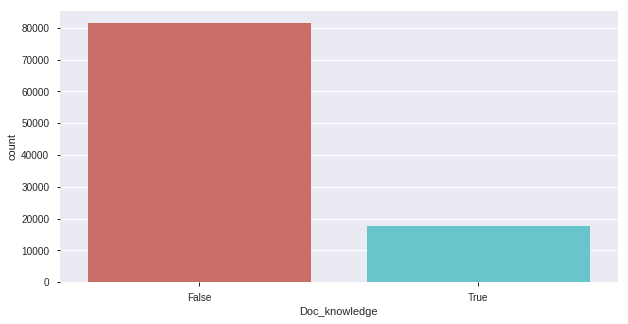

In [50]:
plt.figure(figsize=(10,5))
sns.countplot(x='Doc_knowledge', data=train1, palette='hls')

In [51]:
#exploring the confirmation_check column
train1.confirmation_check.value_counts() #majority times, the priority field was not double-checked

False    70526
True     28672
Name: confirmation_check, dtype: int64

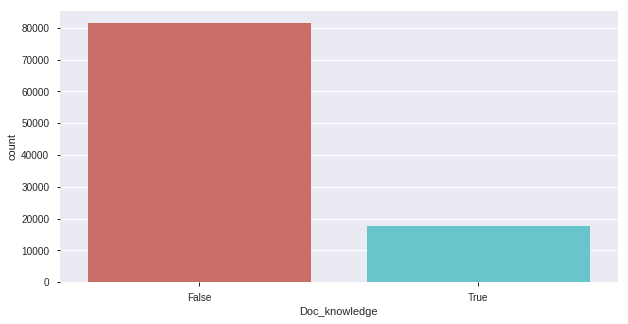

In [52]:
plt.figure(figsize=(10,5))
sns.countplot(x='Doc_knowledge', data=train1, palette='hls')

In [53]:
#exploring the impact column
train1.impact.value_counts() #majority of the incidents belong to the medium impact category. 
                             #High impact incidents are the least

2 - Medium    94034
3 - Low        2720
1 - High       2444
Name: impact, dtype: int64

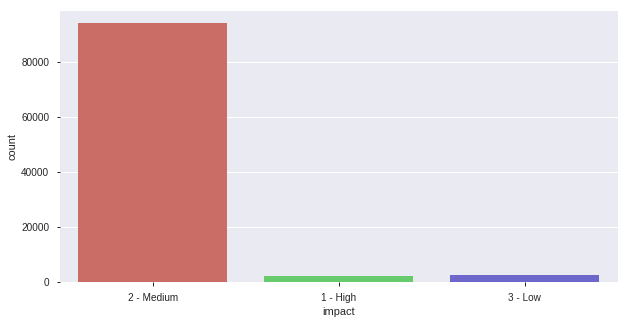

In [54]:
plt.figure(figsize=(10,5))
sns.countplot(x='impact', data=train1, palette='hls')

In [55]:
#exploring the notify column
train1.notify.value_counts() # notifications were not generated for majority of the incidents.Generated only for 85 incidents 

Do Not Notify    99113
Send Email          85
Name: notify, dtype: int64

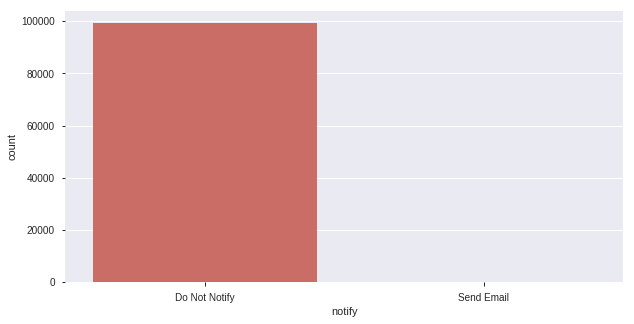

In [56]:
plt.figure(figsize=(10,5))
sns.countplot(x='notify', data=train1, palette='hls')

In [57]:
#exploring the problem_ID column
train.problem_ID.value_counts() #problem ID 14 is the major problem identifier associated with the incidents.There are 241 levels

?                  97620
Problem ID  14       114
Problem ID  2        112
Problem ID  52        55
Problem ID  239       35
                   ...  
Problem ID  181        1
Problem ID  143        1
Problem ID  168        1
Problem ID  233        1
Problem ID  33         1
Name: problem_ID, Length: 242, dtype: int64

In [58]:
#exploring the change_request column
train.change_request.value_counts() #CHG0001230 is the major request . #there are 177 levels

?             98512
CHG0001230       15
CHG0000132       13
CHG0000342       12
CHG0000047       12
              ...  
CHG0000540        1
CHG0000870        1
CHG0000968        1
CHG0003305        1
CHG0001389        1
Name: change_request, Length: 178, dtype: int64

# Imputation

**we use the categoricalImputer() function to impute the missing values. NaN values are replaced with the mode/most repeated values
the columns problem_ID and change_request were dropped because of the huge number of null values. Imputing those columns will make our data biased**

In [59]:
#finding out the columns with null values in the train data
nan_cols_train = [i for i in train1.columns if train1[i].isnull().any()]

In [60]:
nan_cols_train

['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge']

In [61]:
#finding out the columns with null values in the test data
nan_cols_test = [i for i in test1.columns if test1[i].isnull().any()]

In [62]:
nan_cols_test

['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge']

In [63]:
#creating a new dataset with only the columns containing missing values from the training dataset
trainnan=train1[['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge']]

In [64]:
#creating a new dataset with only the columns containing missing values from the test dataset
testnan=test1[['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge']]

In [65]:
trainnan.head()

,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,NaN
1,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,NaN
2,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,NaN
3,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
4,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31


In [66]:
testnan.head()

,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,NaN
1,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 70,Resolver 89
2,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
3,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 89
4,Caller 4416,Opened by 8,Location 204,Category 20,Symptom 471,Group 70,NaN


In [67]:
#loading the categorical imputer function
from sklearn_pandas import CategoricalImputer
imputer = CategoricalImputer()

In [68]:
#imputing the columns in the training set to replace NaN values 
list1 = trainnan.columns
for i in list1:
    trainnan[i] = imputer.fit_transform(trainnan[i])

In [69]:
trainnan.head() #Nan values have been replaced

,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
1,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
2,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
3,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
4,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31


In [70]:
#imputing the columns in the test set to replace NaN values 
list2 = testnan.columns
for j in list2:
    testnan[j] = imputer.fit_transform(testnan[j])

In [71]:
testnan.head()#NaN values have been replaced

,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
1,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 70,Resolver 89
2,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
3,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 89
4,Caller 4416,Opened by 8,Location 204,Category 20,Symptom 471,Group 70,Resolver 17


**now we need to add these imputed columns to the original test and train data**

In [72]:
#dropping the columns with missing values from the initial training set
train1.drop(['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge'], axis=1, inplace=True)

In [73]:
train1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,opened_time,updated_by,updated_at,type_contact,Doc_knowledge,confirmation_check,impact,notify
0,INC0000045,New,True,0,0,0,29-02-2016 01:16,Updated by 21,29-02-2016 01:23,Phone,True,False,2 - Medium,Do Not Notify
1,INC0000045,Resolved,True,0,0,3,29-02-2016 01:16,Updated by 804,29-02-2016 11:29,Phone,True,False,2 - Medium,Do Not Notify
2,INC0000045,Closed,False,0,0,4,29-02-2016 01:16,Updated by 908,05-03-2016 12:00,Phone,True,False,2 - Medium,Do Not Notify
3,INC0000047,Active,True,1,0,1,29-02-2016 04:40,Updated by 21,29-02-2016 05:30,Phone,True,False,2 - Medium,Do Not Notify
4,INC0000047,Active,True,1,0,2,29-02-2016 04:40,Updated by 21,29-02-2016 05:33,Phone,True,False,2 - Medium,Do Not Notify


In [74]:
#combining the imputed columns with the above training set, we get the completely imputed training set
train_clean=pd.concat([train1, trainnan], axis=1)

In [75]:
#checking the details of the final imputed training set
train_clean.info()
#Null Values have been successfully imputed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
active                99198 non-null bool
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
type_contact          99198 non-null object
Doc_knowledge         99198 non-null bool
confirmation_check    99198 non-null bool
impact                99198 non-null object
notify                99198 non-null object
ID_caller             99198 non-null object
opened_by             99198 non-null object
location              99198 non-null object
category_ID           99198 non-null object
user_symptom          99198 non-null object
Support_group         99198 non-null object
support_incharge    

In [76]:
#dropping the columns with missing values from the initial test set
test1.drop(['ID_caller',
 'opened_by',
 'location',
 'category_ID',
 'user_symptom',
 'Support_group',
 'support_incharge'], axis=1, inplace=True)

In [77]:
test1.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,opened_time,updated_by,updated_at,type_contact,Doc_knowledge,confirmation_check,notify
0,INC0000045,Resolved,True,0,0,2,29-02-2016 01:16,Updated by 642,29-02-2016 08:53,Phone,True,False,Do Not Notify
1,INC0000047,New,True,0,0,0,29-02-2016 04:40,Updated by 746,29-02-2016 04:57,Phone,True,False,Do Not Notify
2,INC0000047,Active,True,1,0,3,29-02-2016 04:40,Updated by 804,29-02-2016 11:31,Phone,True,False,Do Not Notify
3,INC0000047,Resolved,True,1,0,7,29-02-2016 04:40,Updated by 332,01-03-2016 09:52,Phone,True,False,Do Not Notify
4,INC0000057,New,True,0,0,4,29-02-2016 06:10,Updated by 21,01-03-2016 02:54,Phone,True,False,Do Not Notify


In [78]:
#combining the imputed test columns with the above test set, we get the completely imputed test set
test_clean=pd.concat([test1, testnan], axis=1)

In [79]:
#checking the details of the final imputed test set
test_clean.info()
#Null Values have been successfully imputed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42514 entries, 0 to 42513
Data columns (total 20 columns):
ID                    42514 non-null object
ID_status             42514 non-null object
active                42514 non-null bool
count_reassign        42514 non-null int64
count_opening         42514 non-null int64
count_updated         42514 non-null int64
opened_time           42514 non-null object
updated_by            42514 non-null object
updated_at            42514 non-null object
type_contact          42514 non-null object
Doc_knowledge         42514 non-null bool
confirmation_check    42514 non-null bool
notify                42514 non-null object
ID_caller             42514 non-null object
opened_by             42514 non-null object
location              42514 non-null object
category_ID           42514 non-null object
user_symptom          42514 non-null object
Support_group         42514 non-null object
support_incharge      42514 non-null object
dtypes: bool(3), int

In [80]:
#writing the cleaned train data to a csv file
train_clean.to_csv(r'train_clean.csv')

In [81]:
#downloading the file
from IPython.display import FileLink
FileLink(r'train_clean.csv')

/kaggle/working/train_clean.csv

In [82]:
#writing the cleaned test data to a csv file
test_clean.to_csv(r'test_clean.csv')

In [83]:
#downloading the file
from IPython.display import FileLink
FileLink(r'test_clean.csv')

/kaggle/working/test_clean.csv

In [84]:
#Creating the Exploratory Data Analysis of our cleaned train dataset
report2 = pdp.ProfileReport(train_clean, title='Pandas Profiling Report', style={'full_width':True})

report2

# Feature Selection

In [85]:
#label encoding the whole cleaned dataset
# import labelencoder
from sklearn.preprocessing import LabelEncoder
# instantiate labelencoder object
# Create dictionary for label encoders
label_enc_dict = {}
train_clean_enc=train_clean.copy()
# Loop over columns to encode
for col_name in train_clean_enc:
    # Create ordinal encoder for the column
    
    label_enc_dict[col_name] = LabelEncoder()
    # Select the non-null values in the column
    col = train_clean_enc[col_name]
    col_not_null = col[col.notnull()]
    reshaped_vals = col_not_null.values.reshape(-1, 1)
    # Encode the non-null values of the column
    encoded_vals = label_enc_dict[col_name].fit_transform(reshaped_vals)
    # Replace the columns with label encoded values
    train_clean_enc.loc[col.notnull(), col_name] = np.squeeze(encoded_vals)


In [86]:
train_clean_enc.head(30)

,ID,ID_status,active,count_reassign,count_opening,count_updated,opened_time,updated_by,updated_at,type_contact,...,confirmation_check,impact,notify,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,0,7,1,0,0,0,17638,94,38978,3,...,0,1,0,1455,200,43,44,491,46,72
1,0,8,1,0,0,3,17638,585,39083,3,...,0,1,0,1455,200,43,44,491,46,72
2,0,6,0,0,0,4,17638,681,6456,3,...,0,1,0,1455,200,43,44,491,46,72
3,1,1,1,1,0,1,17639,94,38979,3,...,0,1,0,1455,120,62,29,344,14,164
4,1,1,1,1,0,2,17639,94,38980,3,...,0,1,0,1455,120,62,29,344,14,164
5,1,1,1,1,0,4,17639,504,39084,3,...,0,1,0,1455,120,62,29,344,14,164
6,1,1,1,1,0,5,17639,197,120,3,...,0,1,0,1455,120,62,29,344,14,164
7,1,4,1,1,0,6,17639,197,120,3,...,0,1,0,1455,120,62,29,344,14,220
8,1,6,0,1,0,8,17639,681,7953,3,...,0,1,0,1455,120,62,29,344,14,220
9,2,7,1,0,0,0,17640,94,38981,3,...,0,1,0,3522,200,104,9,344,62,72


In [87]:
train_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
active                99198 non-null bool
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
type_contact          99198 non-null object
Doc_knowledge         99198 non-null bool
confirmation_check    99198 non-null bool
impact                99198 non-null object
notify                99198 non-null object
ID_caller             99198 non-null object
opened_by             99198 non-null object
location              99198 non-null object
category_ID           99198 non-null object
user_symptom          99198 non-null object
Support_group         99198 non-null object
support_incharge    

In [88]:
train_clean_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null int64
ID_status             99198 non-null int64
active                99198 non-null int64
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null int64
updated_by            99198 non-null int64
updated_at            99198 non-null int64
type_contact          99198 non-null int64
Doc_knowledge         99198 non-null int64
confirmation_check    99198 non-null int64
impact                99198 non-null int64
notify                99198 non-null int64
ID_caller             99198 non-null int64
opened_by             99198 non-null int64
location              99198 non-null int64
category_ID           99198 non-null int64
user_symptom          99198 non-null int64
Support_group         99198 non-null int64
support_incharge      99198 non

In [89]:
label_enc_dict

{'ID': LabelEncoder(),
 'ID_status': LabelEncoder(),
 'active': LabelEncoder(),
 'count_reassign': LabelEncoder(),
 'count_opening': LabelEncoder(),
 'count_updated': LabelEncoder(),
 'opened_time': LabelEncoder(),
 'updated_by': LabelEncoder(),
 'updated_at': LabelEncoder(),
 'type_contact': LabelEncoder(),
 'Doc_knowledge': LabelEncoder(),
 'confirmation_check': LabelEncoder(),
 'impact': LabelEncoder(),
 'notify': LabelEncoder(),
 'ID_caller': LabelEncoder(),
 'opened_by': LabelEncoder(),
 'location': LabelEncoder(),
 'category_ID': LabelEncoder(),
 'user_symptom': LabelEncoder(),
 'Support_group': LabelEncoder(),
 'support_incharge': LabelEncoder()}

# Trying out xGBoost without doing feature selection

In [90]:
xgX=train_clean_enc.drop('impact', axis=1)
xgY=train_clean_enc[['impact']]

In [91]:
#splitting the train data again into train and test data
from sklearn.model_selection import train_test_split

xgXtrain,xgXtest,xgYtrain,xgYtest = train_test_split(xgX,xgY, test_size=0.2)

In [92]:
xgYtrain.impact.value_counts()

1    75245
2     2151
0     1962
Name: impact, dtype: int64

In [93]:
xgYtest.impact.value_counts()

1    18789
2      569
0      482
Name: impact, dtype: int64

In [94]:
#import XGBoost classifier and accuracy
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

In [95]:
#instantiate model and train
xgbmodel = XGBClassifier(learning_rate = 0.05, n_estimators=300, max_depth=5)

In [96]:
#instantiate model and train
xgbmodel.fit(xgXtrain,xgYtrain.values.ravel())

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=300, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [97]:
#predicting using the model and the validation data
xgb_preds = xgbmodel.predict(xgXtest)

In [98]:
np.mean(xgYtest.impact == xgb_preds)

0.9669858870967742

In [99]:
from sklearn.metrics import classification_report, confusion_matrix

In [100]:
#precision and recall of the xgboost model
print(confusion_matrix(xgYtest.impact, xgb_preds))
print(classification_report(xgYtest.impact, xgb_preds))

[[  125   357     0]
 [   12 18746    31]
 [    2   253   314]]
              precision    recall  f1-score   support

           0       0.90      0.26      0.40       482
           1       0.97      1.00      0.98     18789
           2       0.91      0.55      0.69       569

    accuracy                           0.97     19840
   macro avg       0.93      0.60      0.69     19840
weighted avg       0.97      0.97      0.96     19840



In [101]:
from xgboost import plot_importance

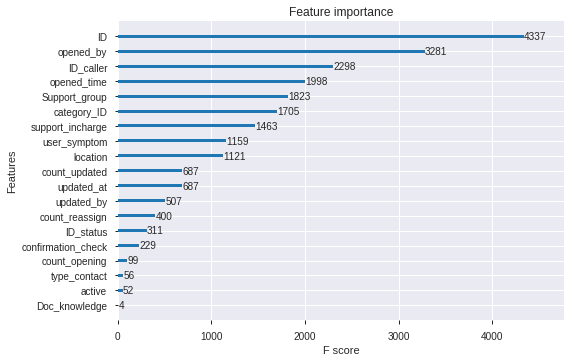

In [102]:
# plot feature importance
plot_importance(xgbmodel)

**Feature Selection Using Recursive Feature Elimination with Cross-Validation (RFECV)**

In [103]:
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV

In [104]:
train_clean_enc.impact.value_counts()

1    94034
2     2720
0     2444
Name: impact, dtype: int64

In [105]:
#implementing RFECV
X = train_clean_enc.drop('impact', axis=1)
target = train_clean_enc['impact']
rfc = RandomForestClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=1, cv=StratifiedKFold(10), scoring='accuracy')
rfecv.fit(X, target)

RFECV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
      estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                       criterion='gini', max_depth=None,
                                       max_features='auto', max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       n_estimators='warn', n_jobs=None,
                                       oob_score=False, random_state=101,
                                       verbose=0, warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
      verbose=0)

In [106]:
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 15


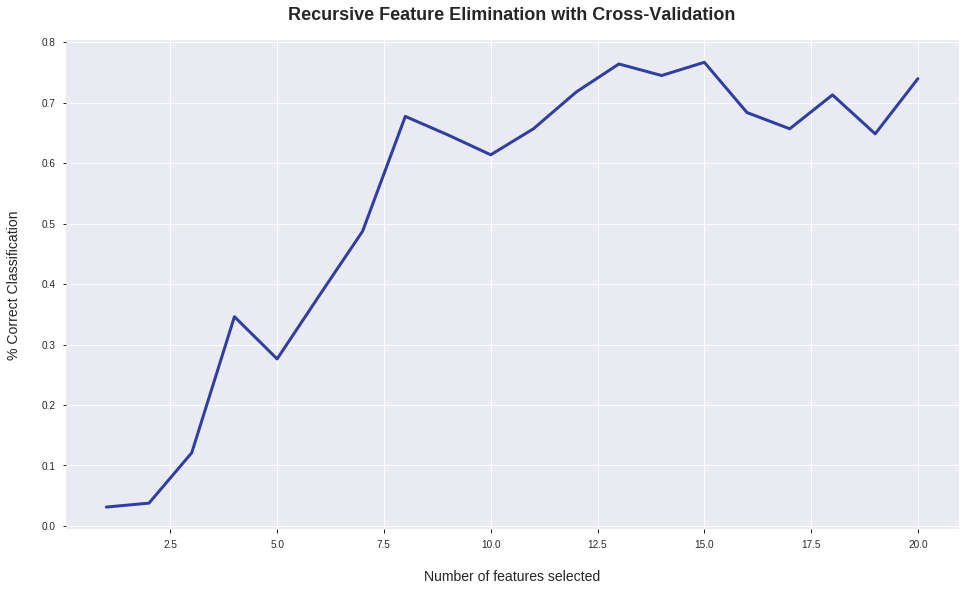

In [107]:
#plotting the accuracy based on number of features selected
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, color='#303F9F', linewidth=3)

plt.show()

In [108]:
#printing the features that are least important
print(np.where(rfecv.support_ == False)[0])

X.drop(X.columns[np.where(rfecv.support_ == False)[0]], axis=1, inplace=True)

[ 2  4  9 10 12]


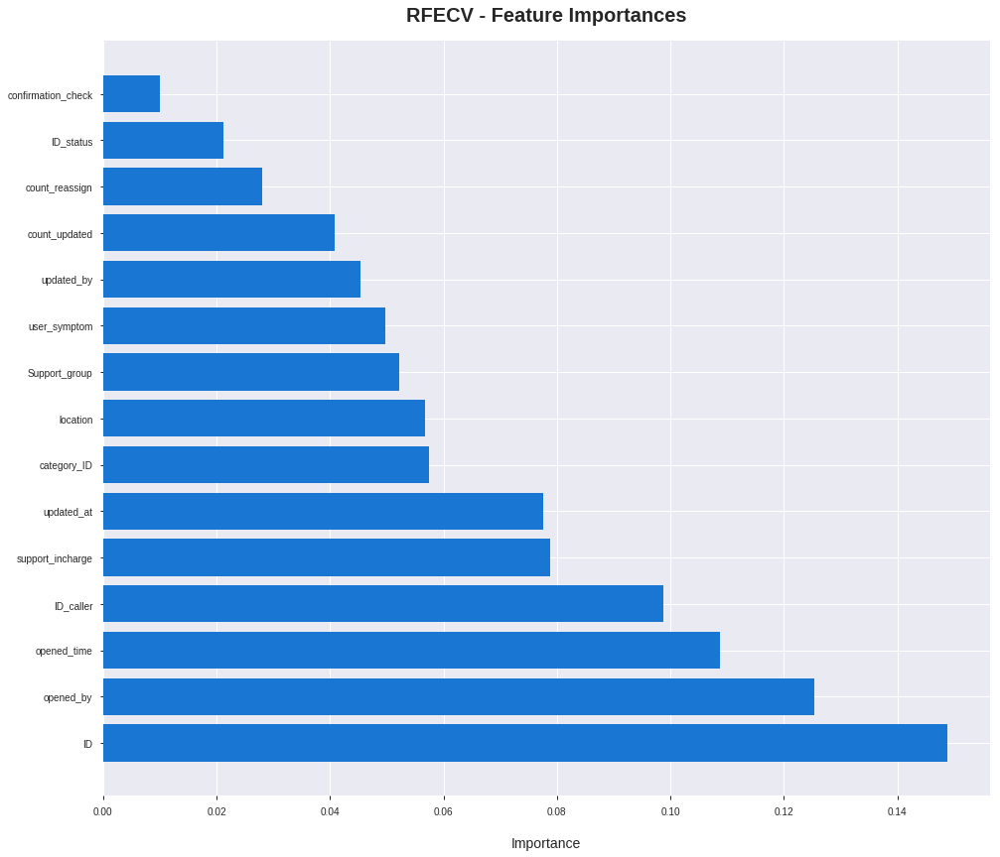

In [109]:
#Plot showing the importance of the 15 features selected
dset = pd.DataFrame()
dset['attr'] = X.columns
dset['importance'] = rfecv.estimator_.feature_importances_

dset = dset.sort_values(by='importance', ascending=False)


plt.figure(figsize=(16, 14))
plt.barh(y=dset['attr'], width=dset['importance'], color='#1976D2')
plt.title('RFECV - Feature Importances', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Importance', fontsize=14, labelpad=20)
plt.show()

In [110]:
X.columns

Index(['ID', 'ID_status', 'count_reassign', 'count_updated', 'opened_time',
       'updated_by', 'updated_at', 'confirmation_check', 'ID_caller',
       'opened_by', 'location', 'category_ID', 'user_symptom', 'Support_group',
       'support_incharge'],
      dtype='object')

# Selecting the columns to build the model from the cleaned train data

In [111]:
train_clean.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
active                99198 non-null bool
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
type_contact          99198 non-null object
Doc_knowledge         99198 non-null bool
confirmation_check    99198 non-null bool
impact                99198 non-null object
notify                99198 non-null object
ID_caller             99198 non-null object
opened_by             99198 non-null object
location              99198 non-null object
category_ID           99198 non-null object
user_symptom          99198 non-null object
Support_group         99198 non-null object
support_incharge    

In [112]:
output=train_clean[['impact']]
predictors=train_clean[['ID', 'ID_status', 'count_reassign', 'count_updated', 'opened_time',
           'updated_by', 'updated_at', 'confirmation_check', 'ID_caller',
           'opened_by', 'location', 'category_ID', 'user_symptom', 'Support_group',
           'support_incharge']]

In [113]:
predictors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 15 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
count_reassign        99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
confirmation_check    99198 non-null bool
ID_caller             99198 non-null object
opened_by             99198 non-null object
location              99198 non-null object
category_ID           99198 non-null object
user_symptom          99198 non-null object
Support_group         99198 non-null object
support_incharge      99198 non-null object
dtypes: bool(1), int64(2), object(12)
memory usage: 10.7+ MB


In [114]:
predictors.head()

,ID,ID_status,count_reassign,count_updated,opened_time,updated_by,updated_at,confirmation_check,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,INC0000045,New,0,0,29-02-2016 01:16,Updated by 21,29-02-2016 01:23,False,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
1,INC0000045,Resolved,0,3,29-02-2016 01:16,Updated by 804,29-02-2016 11:29,False,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
2,INC0000045,Closed,0,4,29-02-2016 01:16,Updated by 908,05-03-2016 12:00,False,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
3,INC0000047,Active,1,1,29-02-2016 04:40,Updated by 21,29-02-2016 05:30,False,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
4,INC0000047,Active,1,2,29-02-2016 04:40,Updated by 21,29-02-2016 05:33,False,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31


In [115]:
# encoding the boolean columns columns
predictors['confirmation_check']=LabelEncoder().fit_transform(predictors['confirmation_check'])

In [116]:
predictors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 15 columns):
ID                    99198 non-null object
ID_status             99198 non-null object
count_reassign        99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null object
updated_by            99198 non-null object
updated_at            99198 non-null object
confirmation_check    99198 non-null int64
ID_caller             99198 non-null object
opened_by             99198 non-null object
location              99198 non-null object
category_ID           99198 non-null object
user_symptom          99198 non-null object
Support_group         99198 non-null object
support_incharge      99198 non-null object
dtypes: int64(3), object(12)
memory usage: 11.4+ MB


In [117]:
predictors.head()

,ID,ID_status,count_reassign,count_updated,opened_time,updated_by,updated_at,confirmation_check,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
0,INC0000045,New,0,0,29-02-2016 01:16,Updated by 21,29-02-2016 01:23,0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
1,INC0000045,Resolved,0,3,29-02-2016 01:16,Updated by 804,29-02-2016 11:29,0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
2,INC0000045,Closed,0,4,29-02-2016 01:16,Updated by 908,05-03-2016 12:00,0,Caller 2403,Opened by 8,Location 143,Category 55,Symptom 72,Group 56,Resolver 17
3,INC0000047,Active,1,1,29-02-2016 04:40,Updated by 21,29-02-2016 05:30,0,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31
4,INC0000047,Active,1,2,29-02-2016 04:40,Updated by 21,29-02-2016 05:33,0,Caller 2403,Opened by 397,Location 165,Category 40,Symptom 471,Group 24,Resolver 31


# MODEL BUILDING

## Encoding the data and splitting it into train and test for validation

In [118]:
#label encoding the predictor variables
# instantiate labelencoder object
# Create dictionary for label encoders
label_enc_pred_dict = {}
predictor_enc=predictors.copy()
# Loop over columns to encode
for col_name in predictor_enc:
    # Create ordinal encoder for the column
    
    label_enc_pred_dict[col_name] = LabelEncoder()
    # Select the non-null values in the column
    col = predictor_enc[col_name]
    col_not_null = col[col.notnull()]
    reshaped_vals = col_not_null.values.reshape(-1, 1)
    # Encode the non-null values of the column
    encoded_vals = label_enc_pred_dict[col_name].fit_transform(reshaped_vals)
    # Replace the columns with label encoded values
    predictor_enc.loc[col.notnull(), col_name] = np.squeeze(encoded_vals)

In [119]:
predictor_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 15 columns):
ID                    99198 non-null int64
ID_status             99198 non-null int64
count_reassign        99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null int64
updated_by            99198 non-null int64
updated_at            99198 non-null int64
confirmation_check    99198 non-null int64
ID_caller             99198 non-null int64
opened_by             99198 non-null int64
location              99198 non-null int64
category_ID           99198 non-null int64
user_symptom          99198 non-null int64
Support_group         99198 non-null int64
support_incharge      99198 non-null int64
dtypes: int64(15)
memory usage: 11.4 MB


In [120]:
#label encoding the 
# instantiate labelencoder object
# Create dictionary for label encoders
label_enc_output_dict = {}
output_enc=output.copy()
output_enc['impact']=LabelEncoder().fit_transform(output['impact'])

In [121]:
output_enc.impact.unique

<bound method Series.unique of 0        1
1        1
2        1
3        1
4        1
        ..
99193    1
99194    1
99195    1
99196    1
99197    1
Name: impact, Length: 99198, dtype: int64>

In [122]:
output_enc.impact.value_counts()

1    94034
2     2720
0     2444
Name: impact, dtype: int64

In [123]:
output.impact.value_counts()

2 - Medium    94034
3 - Low        2720
1 - High       2444
Name: impact, dtype: int64

In [124]:
#splitting the data
from sklearn.model_selection import train_test_split

pred_enc_train,pred_enc_test,output_enc_train,output_enc_test = train_test_split(predictor_enc,output_enc, test_size=0.2)

In [125]:
pred_enc_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79358 entries, 78435 to 63630
Data columns (total 15 columns):
ID                    79358 non-null int64
ID_status             79358 non-null int64
count_reassign        79358 non-null int64
count_updated         79358 non-null int64
opened_time           79358 non-null int64
updated_by            79358 non-null int64
updated_at            79358 non-null int64
confirmation_check    79358 non-null int64
ID_caller             79358 non-null int64
opened_by             79358 non-null int64
location              79358 non-null int64
category_ID           79358 non-null int64
user_symptom          79358 non-null int64
Support_group         79358 non-null int64
support_incharge      79358 non-null int64
dtypes: int64(15)
memory usage: 9.7 MB


In [126]:
pred_enc_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19840 entries, 11116 to 98457
Data columns (total 15 columns):
ID                    19840 non-null int64
ID_status             19840 non-null int64
count_reassign        19840 non-null int64
count_updated         19840 non-null int64
opened_time           19840 non-null int64
updated_by            19840 non-null int64
updated_at            19840 non-null int64
confirmation_check    19840 non-null int64
ID_caller             19840 non-null int64
opened_by             19840 non-null int64
location              19840 non-null int64
category_ID           19840 non-null int64
user_symptom          19840 non-null int64
Support_group         19840 non-null int64
support_incharge      19840 non-null int64
dtypes: int64(15)
memory usage: 2.4 MB


In [127]:
output_enc_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79358 entries, 78435 to 63630
Data columns (total 1 columns):
impact    79358 non-null int64
dtypes: int64(1)
memory usage: 1.2 MB


In [128]:
output_enc_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19840 entries, 11116 to 98457
Data columns (total 1 columns):
impact    19840 non-null int64
dtypes: int64(1)
memory usage: 310.0 KB


## Decision Tree Model

In [129]:
import pickle

In [130]:
from sklearn.tree import  DecisionTreeClassifier

In [131]:
from sklearn.metrics import classification_report, confusion_matrix


In [132]:
#creating a model
model = DecisionTreeClassifier(criterion = 'entropy')

In [133]:
#fitting the model
model.fit(pred_enc_train,output_enc_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [134]:
pickle.dump(model, open('model.pkl','wb'))

In [135]:
#predicting using the model and the train data
preds = model.predict(pred_enc_train)

In [136]:
pd.Series(preds).value_counts()

1    75243
2     2185
0     1930
dtype: int64

In [137]:
output_enc.impact.value_counts()

1    94034
2     2720
0     2444
Name: impact, dtype: int64

In [138]:
# Accuracy = train
np.mean(output_enc_train.impact == preds) #training accuracy of 100%

1.0

In [139]:
#predicting using the model and the validation data
preds1 = model.predict(pred_enc_test)

In [140]:
pd.Series(preds1).value_counts()

1    18780
2      535
0      525
dtype: int64

In [141]:
# Accuracy = test
np.mean(output_enc_test.impact == preds1) #validation accuracy of 98.08%

0.9809475806451613

In [142]:
#precision and recall of the decision tree model
print(confusion_matrix(output_enc_test, preds1))
print(classification_report(output_enc_test, preds1))

[[  390   121     3]
 [  131 18600    60]
 [    4    59   472]]
              precision    recall  f1-score   support

           0       0.74      0.76      0.75       514
           1       0.99      0.99      0.99     18791
           2       0.88      0.88      0.88       535

    accuracy                           0.98     19840
   macro avg       0.87      0.88      0.87     19840
weighted avg       0.98      0.98      0.98     19840



## Random Forest Model

In [143]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

In [144]:
#creating a model
model1=RandomForestClassifier(n_jobs=4,oob_score=True,n_estimators=100,criterion="entropy")

In [145]:
#fitting using the model
model1.fit(pred_enc_train,output_enc_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=4,
                       oob_score=True, random_state=None, verbose=0,
                       warm_start=False)

In [146]:
pickle.dump(model1, open('model1.pkl','wb'))

In [147]:
#predicting using the model and the train data
preds2 = model1.predict(pred_enc_train)

In [148]:
pd.Series(preds2).value_counts()

1    75243
2     2185
0     1930
dtype: int64

In [149]:
# Accuracy = train
np.mean(output_enc_train.impact == preds2) #training accuracy of 100%

1.0

In [150]:
#predicting using the model and the validation data
preds3 = model1.predict(pred_enc_test)

In [151]:
pd.Series(preds3).value_counts()

1    19180
2      381
0      279
dtype: int64

In [152]:
# Accuracy = test
np.mean(output_enc_test.impact == preds3) #test accuracy of 97.74%

0.9776713709677419

In [153]:
#precision and recall of the Random forest model
print(confusion_matrix(output_enc_test, preds3))
print(classification_report(output_enc_test, preds3))

[[  264   249     1]
 [   14 18765    12]
 [    1   166   368]]
              precision    recall  f1-score   support

           0       0.95      0.51      0.67       514
           1       0.98      1.00      0.99     18791
           2       0.97      0.69      0.80       535

    accuracy                           0.98     19840
   macro avg       0.96      0.73      0.82     19840
weighted avg       0.98      0.98      0.98     19840



# Creating an Ensemble model

In [154]:
from sklearn.ensemble import VotingClassifier

In [155]:
Ensemble = VotingClassifier(estimators=[('DT', model), ('RF', model1)],
                        voting='soft',
                        weights=[1, 2])

In [156]:
Ensemble.fit(pred_enc_train,output_enc_train)

VotingClassifier(estimators=[('DT',
                              DecisionTreeClassifier(class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=None,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     presort=False,
                                                     random_state=None,
                                                     splitter='best')),
   

In [157]:
pickle.dump(Ensemble, open('Ensemble.pkl','wb'))

In [158]:
#predicting using the model and the validation data
preds_ens = Ensemble.predict(pred_enc_test)

In [159]:
# Accuracy = test
np.mean(output_enc_test.impact == preds_ens) #test accuracy of 98.60%

0.9845262096774193

In [160]:
#precision and recall of the Ensemble model
print(confusion_matrix(output_enc_test, preds_ens))
print(classification_report(output_enc_test, preds_ens))

[[  354   160     0]
 [   37 18723    31]
 [    4    75   456]]
              precision    recall  f1-score   support

           0       0.90      0.69      0.78       514
           1       0.99      1.00      0.99     18791
           2       0.94      0.85      0.89       535

    accuracy                           0.98     19840
   macro avg       0.94      0.85      0.89     19840
weighted avg       0.98      0.98      0.98     19840



## Creating a xGBoost model

In [161]:
#import XGBoost classifier and accuracy
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

In [162]:
#instantiate model and train
modelxgb = XGBClassifier(learning_rate = 0.05, n_estimators=300, max_depth=5)


In [163]:
#instantiate model and train
modelxgb.fit(pred_enc_train,output_enc_train.values.ravel())

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=300, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [164]:
#predicting using the model and the validation data
preds_xgb = modelxgb.predict(pred_enc_test)

In [165]:
# Accuracy = test #96.65
np.mean(output_enc_test.impact == preds_xgb)

0.9652721774193549

In [166]:
#precision and recall of the xgboost model
print(confusion_matrix(output_enc_test, preds_xgb))
print(classification_report(output_enc_test, preds_xgb))

[[  119   392     3]
 [   13 18754    24]
 [    1   256   278]]
              precision    recall  f1-score   support

           0       0.89      0.23      0.37       514
           1       0.97      1.00      0.98     18791
           2       0.91      0.52      0.66       535

    accuracy                           0.97     19840
   macro avg       0.92      0.58      0.67     19840
weighted avg       0.96      0.97      0.96     19840



In [167]:
from xgboost import plot_importance

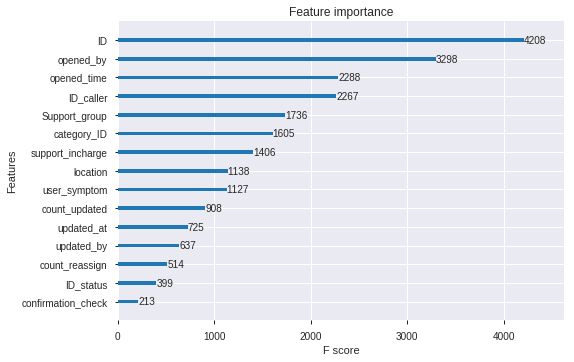

In [168]:
# plot feature importance
plot_importance(modelxgb)


## Creating an Ensemble model with decsion tree , Random forest and xgboost

In [169]:
Ensemble1 = VotingClassifier(estimators=[('DT', model), ('RF', model1), ('XGB',modelxgb)],
                        voting='soft',
                        weights=[2, 3, 2])

In [170]:
Ensemble1.fit(pred_enc_train,output_enc_train.values.ravel())

VotingClassifier(estimators=[('DT',
                              DecisionTreeClassifier(class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=None,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     presort=False,
                                                     random_state=None,
                                                     splitter='best')),
   

In [171]:
#predicting using the model and the validation data
preds_ens1 = Ensemble1.predict(pred_enc_test)

In [172]:
# Accuracy = test
np.mean(output_enc_test.impact == preds_ens1) #test accuracy of 98.10%

0.9821068548387096

In [173]:
#precision and recall of the xgboost model
print(confusion_matrix(output_enc_test, preds_ens1))
print(classification_report(output_enc_test, preds_ens1))

[[  307   206     1]
 [   24 18748    19]
 [    2   103   430]]
              precision    recall  f1-score   support

           0       0.92      0.60      0.72       514
           1       0.98      1.00      0.99     18791
           2       0.96      0.80      0.87       535

    accuracy                           0.98     19840
   macro avg       0.95      0.80      0.86     19840
weighted avg       0.98      0.98      0.98     19840



## Tuning the xgboost model

In [174]:
output_enc_train.impact.value_counts()

1    75243
2     2185
0     1930
Name: impact, dtype: int64

In [175]:
from sklearn.model_selection import RepeatedStratifiedKFold

In [176]:
from sklearn.model_selection import cross_val_score

In [177]:
modelxgbtuned = XGBClassifier(scale_pos_weight=18.25)

In [178]:
modelxgbtuned.fit(pred_enc_train,output_enc_train.values.ravel())

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=18.25, seed=None,
              silent=None, subsample=1, verbosity=1)

In [179]:
#predicting using the model and the validation data
preds_xgbtuned = modelxgbtuned.predict(pred_enc_test)

In [180]:
# Accuracy = test
np.mean(output_enc_test.impact == preds_xgbtuned) #test accuracy of 95.28%

0.9523185483870967

In [181]:
#precision and recall of the xgboost model
print(confusion_matrix(output_enc_test, preds_xgbtuned))
print(classification_report(output_enc_test, preds_xgbtuned))

[[   17   497     0]
 [    9 18769    13]
 [    1   426   108]]
              precision    recall  f1-score   support

           0       0.63      0.03      0.06       514
           1       0.95      1.00      0.98     18791
           2       0.89      0.20      0.33       535

    accuracy                           0.95     19840
   macro avg       0.83      0.41      0.46     19840
weighted avg       0.94      0.95      0.93     19840



## Creating a KNN Model

In [182]:
#Import KNN
from sklearn.neighbors import KNeighborsClassifier as KNC

In [183]:
# creating empty list variable 
acc = []

In [184]:
# running KNN algorithm for 3 to 50 nearest neighbours(odd numbers) and 
# storing the accuracy values 
 
for i in range(3,50,2):
    neigh = KNC(n_neighbors=i)
    neigh.fit(pred_enc_train,output_enc_train)
    train_acc = np.mean(neigh.predict(pred_enc_train)==output_enc_train.impact)
    test_acc = np.mean(neigh.predict(pred_enc_test)==output_enc_test.impact)
    acc.append([train_acc,test_acc])


In [185]:
acc

[[0.9717230776985307, 0.9480846774193549],
 [0.9612011391416114, 0.9485887096774194],
 [0.9558960659290808, 0.9496471774193549],
 [0.9531616220166839, 0.9493951612903225],
 [0.9521661332190832, 0.949546370967742],
 [0.9509816275611784, 0.9479334677419354],
 [0.9508304140729353, 0.9477318548387097],
 [0.9502633634920234, 0.9475806451612904],
 [0.9497215151591522, 0.9475302419354839],
 [0.9493182791905038, 0.9471774193548387],
 [0.9490914589581391, 0.9472782258064516],
 [0.9490158522140175, 0.9475302419354839],
 [0.9488394364777338, 0.946975806451613],
 [0.9488394364777338, 0.9472278225806452],
 [0.9487134252375312, 0.9469254032258064],
 [0.9487134252375312, 0.946875],
 [0.9486756218654704, 0.946875],
 [0.9486252173693893, 0.9469254032258064],
 [0.9486504196174299, 0.9469254032258064],
 [0.9485748128733082, 0.9471270161290323],
 [0.9482597847728017, 0.9469254032258064],
 [0.9482471836487815, 0.9469254032258064],
 [0.9481085712845586, 0.9470766129032258],
 [0.9481085712845586, 0.947076612

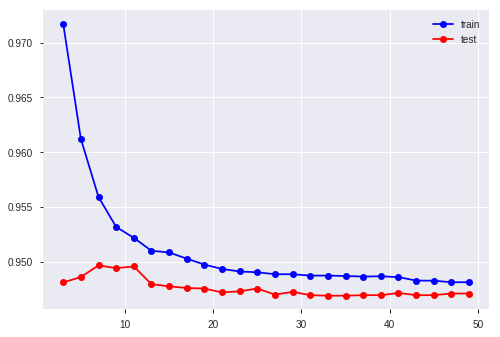

In [186]:
# train accuracy plot 
plt.plot(np.arange(3,50,2),[i[0] for i in acc],"bo-")
# test accuracy plot
plt.plot(np.arange(3,50,2),[i[1] for i in acc],"ro-")

plt.legend(["train","test"])



In [187]:
#We choose k=3 for optimum accuracy
model2 = KNC(n_neighbors= 3)

In [188]:
# Fitting with training data 
model2.fit(pred_enc_train,output_enc_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [189]:
# train accuracy 
 np.mean(model2.predict(pred_enc_train)==output_enc_train.impact) # 97.10 %

0.9717230776985307

In [190]:
# test accuracy 
 np.mean(model2.predict(pred_enc_test)==output_enc_test.impact) # 95.02 %

0.9480846774193549

In [191]:
#precision and recall of the KNN model
print(confusion_matrix(output_enc_test, model2.predict(pred_enc_test)))
print(classification_report(output_enc_test, model2.predict(pred_enc_test)))

[[  166   339     9]
 [  177 18487   127]
 [   13   365   157]]
              precision    recall  f1-score   support

           0       0.47      0.32      0.38       514
           1       0.96      0.98      0.97     18791
           2       0.54      0.29      0.38       535

    accuracy                           0.95     19840
   macro avg       0.66      0.53      0.58     19840
weighted avg       0.94      0.95      0.94     19840



## Building a Naive Bayes Model

In [192]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

In [193]:
ignb = GaussianNB() #Gaussian NB model
imnb = MultinomialNB() #Multinomial NB model

In [194]:
# Building and predicting at the same time 
pred_gnb = ignb.fit(pred_enc_train,output_enc_train).predict(pred_enc_test)
pred_mnb = imnb.fit(pred_enc_train,output_enc_train).predict(pred_enc_test)

In [195]:
# Confusion matrix GaussianNB model
confusion_matrix(output_enc_test,pred_gnb) # GaussianNB model


array([[    4,   507,     3],
       [   78, 18503,   210],
       [    6,   523,     6]])

In [196]:
pd.crosstab(output_enc_test.values.flatten(),pred_gnb) # confusion matrix using Gaussian Model

col_0,0,1,2
row_0,,,
0,4,507,3
1,78,18503,210
2,6,523,6


In [197]:
np.mean(pred_gnb==output_enc_test.values.flatten()) # 93.73% accuracy for Gaussian Naive Bayes Model

0.9331149193548387

In [198]:
print(classification_report(output_enc_test.values.flatten(),pred_gnb))

              precision    recall  f1-score   support

           0       0.05      0.01      0.01       514
           1       0.95      0.98      0.97     18791
           2       0.03      0.01      0.02       535

    accuracy                           0.93     19840
   macro avg       0.34      0.33      0.33     19840
weighted avg       0.90      0.93      0.92     19840



In [199]:
# Confusion matrix MultinomialNB model
confusion_matrix(output_enc_test,pred_mnb) # MultinomialNB model

array([[ 238,   75,  201],
       [8605, 2101, 8085],
       [ 207,   31,  297]])

In [200]:
pd.crosstab(output_enc_test.values.flatten(),pred_mnb) # confusion matrix using Multinomial Model

col_0,0,1,2
row_0,,,
0,238,75,201
1,8605,2101,8085
2,207,31,297


In [201]:
np.mean(pred_mnb==output_enc_test.values.flatten()) # 13.50% accuracy for Multinomial Naive Bayes Model

0.13286290322580646

# Undersampling the encoded dataset

In [202]:
from imblearn.ensemble import BalancedBaggingClassifier


Using TensorFlow backend.


In [203]:
output_enc_train.impact.value_counts()

1    75243
2     2185
0     1930
Name: impact, dtype: int64

In [204]:
bbc = BalancedBaggingClassifier(base_estimator=RandomForestClassifier(),sampling_strategy='majority',replacement=False,random_state=0,warm_start=True)

In [205]:
bbc.fit(pred_enc_train,output_enc_train)

BalancedBaggingClassifier(base_estimator=RandomForestClassifier(bootstrap=True,
                                                                class_weight=None,
                                                                criterion='gini',
                                                                max_depth=None,
                                                                max_features='auto',
                                                                max_leaf_nodes=None,
                                                                min_impurity_decrease=0.0,
                                                                min_impurity_split=None,
                                                                min_samples_leaf=1,
                                                                min_samples_split=2,
                                                                min_weight_fraction_leaf=0.0,
                                                              

In [206]:
 #train accuracy 
 np.mean(bbc.predict(pred_enc_train)==output_enc_train.impact) # 86.224 %

0.8836664230449356

In [207]:
# test accuracy 
 np.mean(bbc.predict(pred_enc_test)==output_enc_test.impact) # 87.177 %

0.869758064516129

In [208]:
pickle.dump(bbc, open('bbc.pkl','wb'))

In [209]:
#precision and recall of the undersampled bagging model with decision tree 
print(confusion_matrix(output_enc_test, bbc.predict(pred_enc_test)))
print(classification_report(output_enc_test, bbc.predict(pred_enc_test)))

[[  455    53     6]
 [ 1380 16309  1102]
 [   13    30   492]]
              precision    recall  f1-score   support

           0       0.25      0.89      0.39       514
           1       0.99      0.87      0.93     18791
           2       0.31      0.92      0.46       535

    accuracy                           0.87     19840
   macro avg       0.52      0.89      0.59     19840
weighted avg       0.96      0.87      0.90     19840



In [210]:
#
#bbc1 = BalancedBaggingClassifier(base_estimator=RandomForestClassifier(),sampling_strategy='majority',replacement=False,random_state=0,warm_start=True)

In [211]:
#bbc1.fit(pred_enc_train,output_enc_train)

In [212]:
# train accuracy 
 #np.mean(bbc1.predict(pred_enc_train)==output_enc_train.impact) # 88.34 %

In [213]:
# test accuracy 
 #np.mean(bbc1.predict(pred_enc_test)==output_enc_test.impact) # 87.303 %

In [214]:
#precision and recall of the undersampled bagging model with random forest
#print(confusion_matrix(output_enc_test, bbc1.predict(pred_enc_test)))
#print(classification_report(output_enc_test, bbc1.predict(pred_enc_test)))

In [215]:
#from imblearn.ensemble import BalancedRandomForestClassifier
#brf = BalancedRandomForestClassifier(n_estimators=100, random_state=0,sampling_strategy={0:1800, 1: 1800, 2: 1800})

In [216]:
#brf.fit(pred_enc_train,output_enc_train)

In [217]:
# train accuracy 
 #np.mean(brf.predict(pred_enc_train)==output_enc_train.impact) # 83.84 %

In [218]:
# test accuracy 
 #np.mean(brf.predict(pred_enc_test)==output_enc_test.impact.values) # 82.73 %

In [219]:
#precision and recall of the undersampled balanced random forest classifier model 
#print(confusion_matrix(output_enc_test, brf.predict(pred_enc_test)))
#print(classification_report(output_enc_test, brf.predict(pred_enc_test)))

In [220]:
#from imblearn.ensemble import RUSBoostClassifier

In [221]:
#rusboost = RUSBoostClassifier(n_estimators=200, algorithm='SAMME.R',random_state=0)

In [222]:
#rusboost.fit(pred_enc_train,output_enc_train)

In [223]:
# train accuracy 
 #np.mean(rusboost.predict(pred_enc_train)==output_enc_train.impact) # 75.59 %

In [224]:
# test accuracy 
 #np.mean(rusboost.predict(pred_enc_test)==output_enc_test.impact.values) # 75.74 %

In [225]:
#precision and recall of the undersampled  model 
#print(confusion_matrix(output_enc_test,rusboost.predict(pred_enc_test)))
#print(classification_report(output_enc_test, rusboost.predict(pred_enc_test)))

In [226]:
#from imblearn.ensemble import EasyEnsembleClassifier
#eec = EasyEnsembleClassifier(random_state=0)

In [227]:
#eec.fit(pred_enc_train,output_enc_train) 

In [228]:
# train accuracy 
 #np.mean(eec.predict(pred_enc_train)==output_enc_train.impact) # 70.35 %

In [229]:
# test accuracy 
 #np.mean(eec.predict(pred_enc_test)==output_enc_test.impact.values) # 70.36 %

In [230]:
#precision and recall of the undersampled  model 
#print(confusion_matrix(output_enc_test,eec.predict(pred_enc_test)))
#print(classification_report(output_enc_test, eec.predict(pred_enc_test)))

In [231]:
#overview of the encoded cleaned train data
train_clean_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 21 columns):
ID                    99198 non-null int64
ID_status             99198 non-null int64
active                99198 non-null int64
count_reassign        99198 non-null int64
count_opening         99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null int64
updated_by            99198 non-null int64
updated_at            99198 non-null int64
type_contact          99198 non-null int64
Doc_knowledge         99198 non-null int64
confirmation_check    99198 non-null int64
impact                99198 non-null int64
notify                99198 non-null int64
ID_caller             99198 non-null int64
opened_by             99198 non-null int64
location              99198 non-null int64
category_ID           99198 non-null int64
user_symptom          99198 non-null int64
Support_group         99198 non-null int64
support_incharge      99198 non

In [232]:
#selecting the most important 15 features obtained from RFECV and the target variable
und_train=train_clean_enc[['ID', 'ID_status', 'count_reassign', 'count_updated', 'opened_time',
           'updated_by', 'updated_at', 'confirmation_check', 'ID_caller',
           'opened_by', 'location', 'category_ID', 'user_symptom', 'Support_group',
           'support_incharge','impact']]

In [233]:
und_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99198 entries, 0 to 99197
Data columns (total 16 columns):
ID                    99198 non-null int64
ID_status             99198 non-null int64
count_reassign        99198 non-null int64
count_updated         99198 non-null int64
opened_time           99198 non-null int64
updated_by            99198 non-null int64
updated_at            99198 non-null int64
confirmation_check    99198 non-null int64
ID_caller             99198 non-null int64
opened_by             99198 non-null int64
location              99198 non-null int64
category_ID           99198 non-null int64
user_symptom          99198 non-null int64
Support_group         99198 non-null int64
support_incharge      99198 non-null int64
impact                99198 non-null int64
dtypes: int64(16)
memory usage: 12.1 MB


In [234]:
und_train.impact.value_counts()

1    94034
2     2720
0     2444
Name: impact, dtype: int64

In [235]:
train_clean.impact.value_counts()

2 - Medium    94034
3 - Low        2720
1 - High       2444
Name: impact, dtype: int64

In [236]:
#undersampling the data
from sklearn.utils import resample
# separate minority and majority classes
Medium = und_train[und_train.impact==1]
Low = und_train[und_train.impact==2]
High = und_train[und_train.impact==0]

Medium_downsampled = resample(Medium,
                                replace = False, # sample without replacement
                                n_samples = len(High), # match minority n
                                random_state = 101) # reproducible results



In [237]:
# combine minority and downsampled majority
downsampled = pd.concat([Medium_downsampled, Low, High ])

In [238]:
downsampled.impact.value_counts()

2    2720
1    2444
0    2444
Name: impact, dtype: int64

In [239]:
downsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7608 entries, 92654 to 99148
Data columns (total 16 columns):
ID                    7608 non-null int64
ID_status             7608 non-null int64
count_reassign        7608 non-null int64
count_updated         7608 non-null int64
opened_time           7608 non-null int64
updated_by            7608 non-null int64
updated_at            7608 non-null int64
confirmation_check    7608 non-null int64
ID_caller             7608 non-null int64
opened_by             7608 non-null int64
location              7608 non-null int64
category_ID           7608 non-null int64
user_symptom          7608 non-null int64
Support_group         7608 non-null int64
support_incharge      7608 non-null int64
impact                7608 non-null int64
dtypes: int64(16)
memory usage: 1010.4 KB


In [240]:
#splitting the target and predictor variables from the encoded and undersampled data
y_und = downsampled[["impact"]]
X_und = downsampled.drop('impact', axis=1)


In [241]:
X_und

,ID,ID_status,count_reassign,count_updated,opened_time,updated_by,updated_at,confirmation_check,ID_caller,opened_by,location,category_ID,user_symptom,Support_group,support_incharge
92654,22857,8,0,18,15239,86,13907,1,1549,120,59,46,357,56,203
44083,9762,4,1,8,2485,416,10518,0,4135,31,175,15,357,62,164
27059,5500,8,0,0,11444,306,25538,0,1582,61,94,12,357,10,29
24012,4830,8,0,2,10216,203,22838,0,939,34,26,40,357,55,226
70870,16914,8,2,14,640,180,13795,1,4516,31,43,46,128,18,210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99144,24547,7,0,3,5666,278,12526,0,1617,52,168,34,39,12,72
99145,24547,7,0,4,5666,314,12527,0,1617,52,168,34,39,12,72
99146,24547,7,0,5,5666,278,12528,0,1617,52,168,34,39,12,72
99147,24547,8,0,7,5666,81,14025,1,1617,52,168,34,39,12,187


In [242]:
#splitting the undersampled data into training and validation set. 80-20 split
X_und_train, X_und_test, y_und_train, y_und_test = train_test_split(X_und, y_und, test_size=0.2, random_state=50)

In [243]:
y_und_train.impact.value_counts()

2    2148
1    1994
0    1944
Name: impact, dtype: int64

In [244]:
y_und_test.impact.value_counts()

2    572
0    500
1    450
Name: impact, dtype: int64

# Building a decision tree model on the undersampled data

In [245]:
#creating a model
model_und = DecisionTreeClassifier(criterion = 'entropy')

In [246]:
#fitting the model
model_und.fit(X_und_train,y_und_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [247]:
#predicting using the model and the train data
preds_und = model_und.predict(X_und_train)

In [248]:
pd.Series(preds_und).value_counts()

2    2148
1    1994
0    1944
dtype: int64

In [249]:
# Accuracy = train
np.mean(y_und_train.impact == preds_und) #training accuracy of 100%

1.0

In [250]:
#predicting using the model and the validation data
preds_und_1 = model_und.predict(X_und_test)

In [251]:
pd.Series(preds_und_1).value_counts()

2    600
0    534
1    388
dtype: int64

In [252]:
# Accuracy = test
np.mean(y_und_test.impact == preds_und_1) #test accuracy of 86.20%

0.8672798948751642

In [253]:
pickle.dump(model_und, open('model_und_DT.pkl','wb'))

In [254]:
#precision and recall of the Decision Tree model
print(confusion_matrix(y_und_test, model_und.predict(X_und_test.values)))
print(classification_report(y_und_test, model_und.predict(X_und_test.values)))

[[442  42  16]
 [ 84 330  36]
 [  8  16 548]]
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       500
           1       0.85      0.73      0.79       450
           2       0.91      0.96      0.94       572

    accuracy                           0.87      1522
   macro avg       0.86      0.86      0.86      1522
weighted avg       0.87      0.87      0.87      1522



# Building a random forest model on the undersampled data

In [255]:
#creating a model
model_und_1=RandomForestClassifier(n_jobs=4,oob_score=True,n_estimators=100,criterion="entropy")

In [256]:
#fitting the model
model_und_1.fit(X_und_train,y_und_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=4,
                       oob_score=True, random_state=None, verbose=0,
                       warm_start=False)

In [257]:
#predicting using the model and the train data
preds_und_2 = model_und_1.predict(X_und_train)

In [258]:
pd.Series(preds_und_2).value_counts()

2    2148
1    1994
0    1944
dtype: int64

In [259]:
# Accuracy = train
np.mean(y_und_train.impact == preds_und_2) #training accuracy of 100%

1.0

In [260]:
#predicting using the model and the validation data
preds_und_3 = model_und_1.predict(X_und_test)

In [261]:
pd.Series(preds_und_3).value_counts()

2    579
0    531
1    412
dtype: int64

In [262]:
# Accuracy = test
np.mean(y_und_test.impact == preds_und_3) #test accuracy of 90.14%

0.8981603153745072

In [263]:
pickle.dump(model_und_1, open('model_und_RF.pkl','wb'))

In [264]:
#precision and recall of the Random Forest model
print(confusion_matrix(y_und_test, model_und_1.predict(X_und_test.values)))
print(classification_report(y_und_test, model_und_1.predict(X_und_test.values)))

[[463  29   8]
 [ 55 364  31]
 [ 13  19 540]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90       500
           1       0.88      0.81      0.84       450
           2       0.93      0.94      0.94       572

    accuracy                           0.90      1522
   macro avg       0.90      0.89      0.89      1522
weighted avg       0.90      0.90      0.90      1522



In [265]:
from sklearn.ensemble import VotingClassifier

In [266]:
est_Ensemble = VotingClassifier(estimators=[('DT', model_und), ('RF', model_und_1)],
                        voting='soft',
                        weights=[1, 3])

In [267]:
est_Ensemble.fit(X_und_train,y_und_train)

VotingClassifier(estimators=[('DT',
                              DecisionTreeClassifier(class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=None,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     presort=False,
                                                     random_state=None,
                                                     splitter='best')),
   

In [268]:
#predicting using the model and the train data
preds_und_est = est_Ensemble.predict(X_und_train)

In [269]:
pd.Series(preds_und_est).value_counts()

2    2148
1    1994
0    1944
dtype: int64

In [270]:
# Accuracy = train
np.mean(y_und_train.impact == preds_und_est) #training accuracy of 100%

1.0

In [271]:
#predicting using the model and the test data
preds_und_est_1 = est_Ensemble.predict(X_und_test)

In [272]:
pd.Series(preds_und_est_1).value_counts()

2    593
0    527
1    402
dtype: int64

In [273]:
# Accuracy = test
np.mean(y_und_test.impact == preds_und_est_1) #test accuracy of 89.49%

0.9053876478318003

In [274]:
pickle.dump(est_Ensemble, open('model_und_ENS.pkl','wb'))

In [275]:
#precision and recall of the Random Forest model
print(confusion_matrix(y_und_test, est_Ensemble.predict(X_und_test.values)))
print(classification_report(y_und_test, est_Ensemble.predict(X_und_test.values)))

[[462  27  11]
 [ 56 364  30]
 [  9  11 552]]
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       500
           1       0.91      0.81      0.85       450
           2       0.93      0.97      0.95       572

    accuracy                           0.91      1522
   macro avg       0.90      0.90      0.90      1522
weighted avg       0.91      0.91      0.90      1522



# Kaggle submissions

In [276]:
#test_clean.info()

In [277]:
#sub_inp=test_clean[['ID', 'ID_status', 'count_reassign', 'count_updated', 'opened_time',
          # 'updated_by', 'updated_at', 'confirmation_check', 'ID_caller',
          # 'opened_by', 'location', 'category_ID', 'user_symptom', 'Support_group',
          # 'support_incharge']]

In [278]:
#sub_inp=test_clean

In [279]:
#sub_inp.info()

In [280]:
#label encoding the predictor variables
# instantiate labelencoder object
# Create dictionary for label encoders
#label_enc_sub_inp_dict = {}
#sub_inp_enc=sub_inp.copy()
# Loop over columns to encode
#for col_name in sub_inp_enc:
    # Create ordinal encoder for the column
    
    #label_enc_sub_inp_dict[col_name] = LabelEncoder()
    # Select the non-null values in the column
    #col = sub_inp_enc[col_name]
    #col_not_null = col[col.notnull()]
    #reshaped_vals = col_not_null.values.reshape(-1, 1)
    #Encode the non-null values of the column
    #encoded_vals = label_enc_sub_inp_dict[col_name].fit_transform(reshaped_vals)
    # Replace the columns with label encoded values
    #sub_inp_enc.loc[col.notnull(), col_name] = np.squeeze(encoded_vals)

In [281]:
#sub_inp_enc.info()

In [282]:
#sub_inp_enc.head()

# Prediction using our models

In [283]:
#prediction using the initial decision tree model
#sub_dt = model.predict(sub_inp_enc)

In [284]:
#pd.Series(sub_dt).value_counts()

In [285]:
#Save Prediciton
#ss1 = pd.DataFrame(zip([x for x in range(1, len(sub_dt)+1)], sub_dt), columns=['ID', 'prediction1'])

In [286]:
#ss1.info()

In [287]:
#ss1.loc[ss1['prediction1']== 1,'prediction1']="2 - Medium"
#ss1.loc[ss1['prediction1']== 0,'prediction1']="1 - High"
#ss1.loc[ss1['prediction1']== 2,'prediction1']="3 - Low"

In [288]:
#ss1.prediction1.value_counts()

In [289]:
#ss1.to_csv('submission1.csv', index=False)

In [290]:
#prediction using the initial random forest model
#sub_rf = model1.predict(sub_inp_enc)

In [291]:
#Save Prediciton
#ss2 = pd.DataFrame(zip([x for x in range(1, len(sub_rf)+1)], sub_rf), columns=['ID', 'prediction1'])

In [292]:
#ss2.prediction1.value_counts()

In [293]:
#ss2

In [294]:
#ss2.loc[ss2['prediction1']== 1,'prediction1']="2 - Medium"
#ss2.loc[ss2['prediction1']== 0,'prediction1']="1 - High"
#ss2.loc[ss2['prediction1']== 2,'prediction1']="3 - Low"

In [295]:
#ss2.head()

In [296]:
#ss2.to_csv('submission2.csv', index=False)

In [297]:
#prediction using the undersampled ensemble model 
#sub_en=est_Ensemble.predict(sub_inp_enc)


In [298]:
#pd.Series(sub_en).value_counts()

In [299]:
#Save Prediciton
#ss3 = pd.DataFrame(zip([x for x in range(1, len(sub_en)+1)], sub_en), columns=['ID', 'prediction1'])

In [300]:
#ss3.loc[ss3['prediction1']== 1,'prediction1']="2 - Medium"
#ss3.loc[ss3['prediction1']== 0,'prediction1']="1 - High"
#ss3.loc[ss3['prediction1']== 2,'prediction1']="3 - Low"

In [301]:
#ss3.head()

In [302]:
#ss3.to_csv('submission3.csv', index=False)

In [303]:
#prediction using bagging classifier
#sub_bg = bbc.predict(sub_inp_enc)

In [304]:
#Save Prediciton
#ss4 = pd.DataFrame(zip([x for x in range(1, len(sub_bg)+1)], sub_bg), columns=['ID', 'prediction1'])

In [305]:
#ss4.prediction1.value_counts()

In [306]:
#ss4.loc[ss4['prediction1']== 1,'prediction1']="2 - Medium"
#ss4.loc[ss4['prediction1']== 0,'prediction1']="1 - High"
#ss4.loc[ss4['prediction1']== 2,'prediction1']="3 - Low"

In [307]:
#ss4.head()

In [308]:
#ss4.to_csv('submission4.csv', index=False)

In [309]:
#prediction using the original ensembled model
#ens = Ensemble.predict(sub_inp_enc)

In [310]:
#pd.Series(ens).value_counts()

In [311]:
#Save Prediciton
#ss5 = pd.DataFrame(zip([x for x in range(1, len(ens)+1)], ens), columns=['ID', 'prediction1'])

In [312]:
#ss5.head()

In [313]:
#ss5.loc[ss5['prediction1']== 1,'prediction1']="2 - Medium"
#ss5.loc[ss5['prediction1']== 0,'prediction1']="1 - High"
#ss5.loc[ss5['prediction1']== 2,'prediction1']="3 - Low"

In [314]:
#ss5.head()

In [315]:
#ss5.to_csv('submission5.csv', index=False)

In [316]:
#prediction using the original xgboost model
#xgb = modelxgb.predict(sub_inp_enc)

In [317]:
#pd.Series(xgb).value_counts()

In [318]:
#Save Prediciton
#ss7 = pd.DataFrame(zip([x for x in range(1, len(xgb)+1)], xgb), columns=['ID', 'prediction1'])

In [319]:
#ss7.head()

In [320]:
#ss7.loc[ss7['prediction1']== 1,'prediction1']="2 - Medium"
#ss7.loc[ss7['prediction1']== 0,'prediction1']="1 - High"
#ss7.loc[ss7['prediction1']== 2,'prediction1']="3 - Low"

In [321]:
#ss7.head()

In [322]:
#ss7.to_csv('submission7.csv', index=False)

In [323]:
#prediction using ensemble model with initial decision tree, random forest and xgboost


In [324]:
#ens1 = Ensemble1.predict(sub_inp_enc)

In [325]:
#pd.Series(ens1).value_counts()

In [326]:
#Save Prediciton
#ss8 = pd.DataFrame(zip([x for x in range(1, len(ens1)+1)], ens1), columns=['ID', 'prediction1'])

In [327]:
#ss8.head()

In [328]:
#ss8.loc[ss8['prediction1']== 1,'prediction1']="2 - Medium"
#ss8.loc[ss8['prediction1']== 0,'prediction1']="1 - High"
#ss8.loc[ss8['prediction1']== 2,'prediction1']="3 - Low"

In [329]:
#ss8.head()

In [330]:
#ss8.to_csv('submission8.csv', index=False)

In [331]:
#prediction using xgboost model without feature selection
#xgbnf = xgbmodel.predict(sub_inp_enc)

In [332]:
#pd.Series(xgbnf).value_counts()

In [333]:
#Save Prediciton
#ss9 = pd.DataFrame(zip([x for x in range(1, len(xgbnf)+1)], xgbnf), columns=['ID', 'prediction1'])

In [334]:
#ss9.head()

In [335]:
#ss9.loc[ss9['prediction1']== 1,'prediction1']="2 - Medium"
#ss9.loc[ss9['prediction1']== 0,'prediction1']="1 - High"
#ss9.loc[ss9['prediction1']== 2,'prediction1']="3 - Low"

In [336]:
#ss9.head()

In [337]:
#ss9.to_csv('submission9.csv', index=False)

In [338]:
#prediction using tuned xgboost model 
#xgbtun = modelxgbtuned.predict(sub_inp_enc)

In [339]:
#pd.Series(xgbtun).value_counts()

In [340]:
#Save Prediciton
#ss11 = pd.DataFrame(zip([x for x in range(1, len(xgbtun)+1)], xgbtun), columns=['ID', 'prediction1'])

In [341]:
#ss11.loc[ss11['prediction1']== 1,'prediction1']="2 - Medium"
#ss11.loc[ss11['prediction1']== 0,'prediction1']="1 - High"

#ss11.loc[ss11['prediction1']== 2,'prediction1']="3 - Low"

In [342]:
#ss11.head()

In [343]:
#ss11.to_csv('submission11.csv', index=False)